In [1]:
!git clone https://github.com/italojs/facial-landmarks-recognition.git

Cloning into 'facial-landmarks-recognition'...
remote: Enumerating objects: 8, done.
remote: Total 8 (delta 0), reused 0 (delta 0), pack-reused 8
Receiving objects: 100% (8/8), 68.98 MiB | 31.02 MiB/s, done.
Resolving deltas: 100% (1/1), done.


In [54]:
import cv2
from cv2 import VideoCapture, imshow, waitKey, destroyAllWindows
from matplotlib import pyplot as plt
import numpy as np

In [55]:
# Create video capture object
capture = VideoCapture("Sources/Video.mp4") # this is a 5 sec video

# Check that a camera connection has been established
if not capture.isOpened():
    print("Error establishing connection")

frames = []

while capture.isOpened():

    # Read an image frame
    ret, frame = capture.read()
    if not ret:
        break
    frames.append(frame)

In [56]:
len(frames)

155

In [57]:
All_faces = []
# detect the face
# Read and process each frame
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
for frame in frames:

    # Convert the frame to grayscale for face detection
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # Detect faces in the frame
    faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

    # Draw rectangles around the detected faces
    x, y, w, h = faces[0]
    face = frame[y:y+h, x:x+w]
    All_faces.append(face)

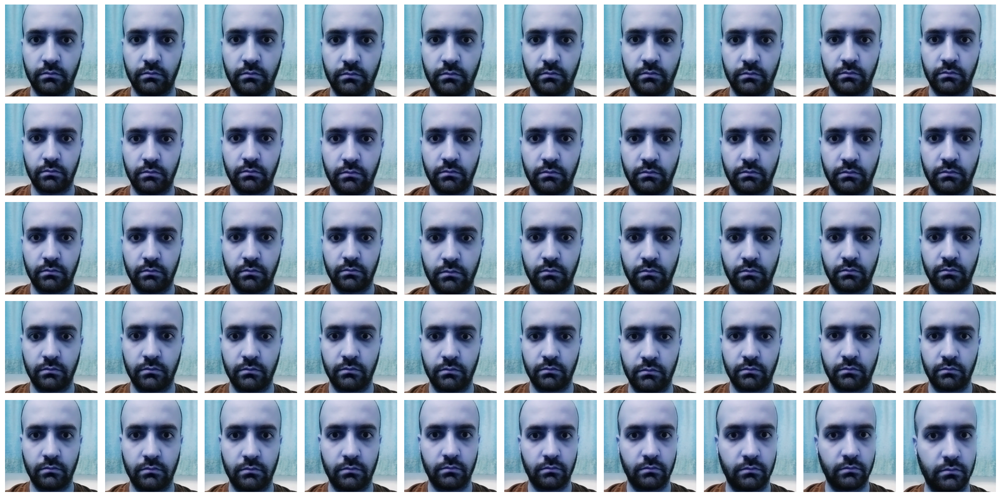

In [58]:
#Let's take a look at the first 50 recognizied faces
fig, axs = plt.subplots(5, 10, figsize=(20, 10))  # 5 rows, 10 columns

# Flattening the axes to easily iterate through subplots
axs = axs.flatten()

for i, ax in enumerate(axs):
    ax.imshow(All_faces[i], cmap='gray')  # Displaying each image
    ax.axis('off')  # Turn off axis labels

plt.tight_layout()  # Adjust layout for better presentation
plt.show()

In [60]:
#let's resize all the image to make sure they are the same size
def resize_image(image):
    size = 200
    # Resize the image
    resized_img = cv2.resize(image, (size, size))
    return resized_img

All_faces = [resize_image(image) for image in All_faces]

In [61]:
All_faces[1].shape

(200, 200, 3)

In [62]:
import pickle
with open('Sources/faces.pickle', 'wb') as handle:
    pickle.dump(All_faces, handle)

In [63]:
import cv2
import dlib
import matplotlib.pyplot as plt
import pickle

In [64]:
with open('Sources/faces.pickle', 'rb') as handle:
    All_faces = pickle.load(handle)

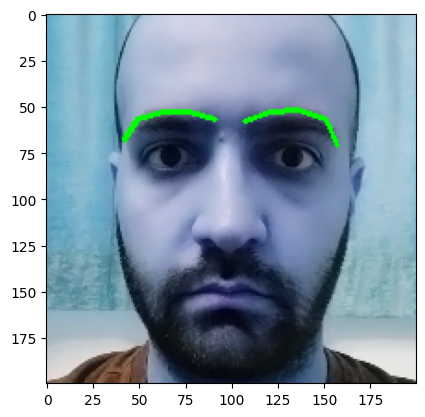

In [65]:
# Load the face detector and facial landmark predictor from Dlib
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('Sources/shape_predictor_68_face_landmarks.dat')
# Replace 'path_to_shape_predictor_68_face_landmarks.dat' with the actual path to the model file

# Load the image of the face
face_image = All_faces[0].copy()
gray = cv2.cvtColor(face_image, cv2.COLOR_BGR2GRAY)

# Detect faces in the image
faces = detector(gray)

for face in faces:
    # Predict facial landmarks for each detected face
    landmarks = predictor(gray, face)

    # Extract eyebrow points (example: points 17-21 for the left eyebrow and 22-26 for the right eyebrow)
    left_eyebrow_pts = [17, 18, 19, 20, 21]  # Example landmark points for the left eyebrow
    right_eyebrow_pts = [22, 23, 24, 25, 26]  # Example landmark points for the right eyebrow

    # Get coordinates of the eyebrow points
    left_eyebrow = [landmarks.part(pt) for pt in left_eyebrow_pts]
    right_eyebrow = [landmarks.part(pt) for pt in right_eyebrow_pts]

    # Draw lines to visualize the eyebrows on the face image
    for i in range(len(left_eyebrow) - 1):
        cv2.line(face_image, (left_eyebrow[i].x, left_eyebrow[i].y), (left_eyebrow[i + 1].x, left_eyebrow[i + 1].y), (0, 255, 0), 2)
    for i in range(len(right_eyebrow) - 1):
        cv2.line(face_image, (right_eyebrow[i].x, right_eyebrow[i].y), (right_eyebrow[i + 1].x, right_eyebrow[i + 1].y), (0, 255, 0), 2)

# Display the face image with detected eyebrows
plt.imshow(face_image)

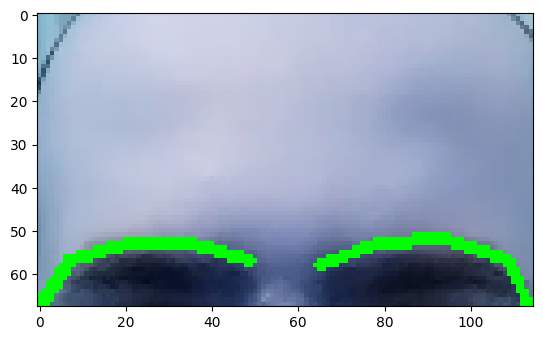

In [66]:
# Now that we have the eyebrows' location, getting the forehead is a piece of cake
plt.imshow(face_image[:left_eyebrow[0].y,left_eyebrow[0].x:right_eyebrow[-1].x,:])

In [67]:
# apply the same thing on all the 50 images
foreheads = []
for face_image in All_faces:
    gray = cv2.cvtColor(face_image, cv2.COLOR_BGR2GRAY)

    # Detect faces in the image
    faces = detector(gray)

    for face in faces:
        # Predict facial landmarks for each detected face
        landmarks = predictor(gray, face)

        # Extract eyebrow points (example: points 17-21 for the left eyebrow and 22-26 for the right eyebrow)
        left_eyebrow_pts = [17, 18, 19, 20, 21]  # Example landmark points for the left eyebrow
        right_eyebrow_pts = [22, 23, 24, 25, 26]  # Example landmark points for the right eyebrow

        # Get coordinates of the eyebrow points
        left_eyebrow = [landmarks.part(pt) for pt in left_eyebrow_pts]
        right_eyebrow = [landmarks.part(pt) for pt in right_eyebrow_pts]
        foreheads.append((left_eyebrow[0].y,left_eyebrow[0].x,right_eyebrow[-1].x))
    # foreheads.append(face_image[:left_eyebrow[0].y,left_eyebrow[0].x:right_eyebrow[-1].x,:])

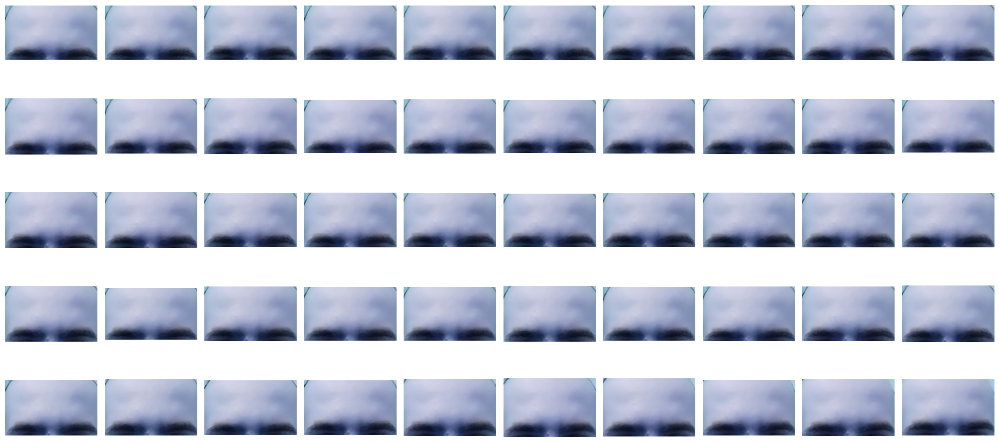

In [68]:
#Let's take a look at all 50 recognizied faces
fig, axs = plt.subplots(5, 10, figsize=(20, 10))  # 5 rows, 10 columns

# Flattening the axes to easily iterate through subplots
axs = axs.flatten()

for i, ax in enumerate(axs):
    ax.imshow(All_faces[i][:foreheads[i][0],foreheads[i][1]:foreheads[i][2],:], cmap='gray')  # Displaying each image
    ax.axis('off')  # Turn off axis labels

plt.tight_layout()  # Adjust layout for better presentation
plt.show()

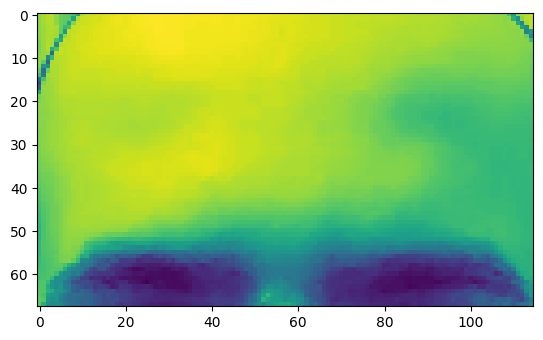

In [69]:
# We need the green channel:
plt.imshow(All_faces[0][:foreheads[0][0],foreheads[0][1]:foreheads[0][2],:][:,:,1])

In [70]:
with open('Sources/foreheads.pickle', 'wb') as handle:
  pickle.dump(foreheads, handle)

In [71]:
import matplotlib.pyplot as plt
import numpy as np
import pickle
from sklearn.decomposition import PCA

In [72]:
with open('Sources/foreheads.pickle', 'rb') as handle:
    foreheads = pickle.load(handle)

In [73]:
with open('Sources/faces.pickle', 'rb') as handle:
    All_faces = pickle.load(handle)

In [74]:
new_pixels = []
for i in range(len(foreheads)):
    pca = PCA(n_components=5)
    pca.fit(All_faces[i][:foreheads[i][0],foreheads[i][1]:foreheads[i][2],:][:,:,1])
    new_pixels.append(pca.transform(All_faces[i][:foreheads[i][0],foreheads[i][1]:foreheads[i][2],:][:,:,1]))

In [79]:
pixel_counter = []
for forehead in new_pixels:
    pixel_counter.append(np.sum(forehead[:,2]))

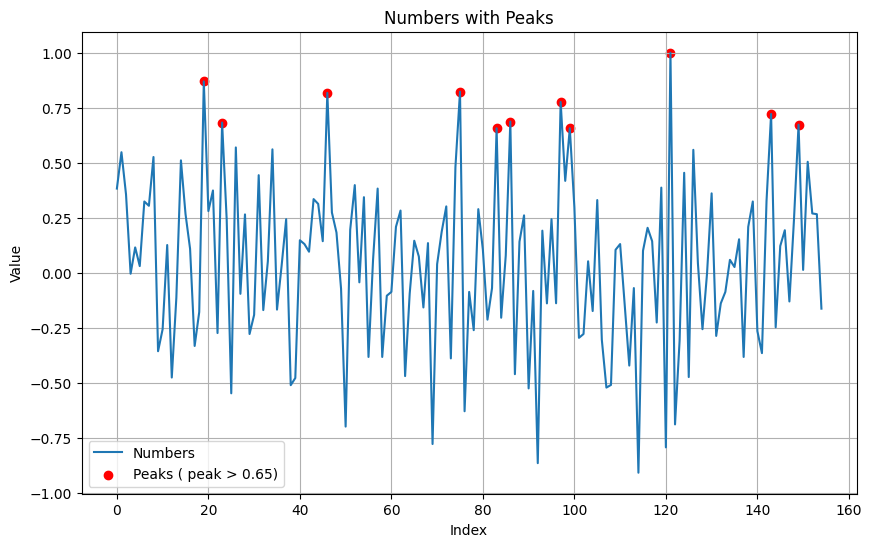

In [80]:
numbers  = pixel_counter/max(pixel_counter)
# Create a list to store peak values and their indices
peaks = [(index, value) for index, value in enumerate(numbers) if value > 0.65]

# Separate indices and values of peaks for plotting
peak_indices, peak_values = zip(*peaks)

# Plotting the list of numbers
plt.figure(figsize=(10, 6))
plt.plot(numbers, label='Numbers')
plt.scatter(peak_indices, peak_values, color='red', marker='o', label='Peaks ( peak > 0.65)')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Numbers with Peaks')
plt.legend()
plt.grid(True)
plt.show()

### we have this:
$$
Heart Rate = P \times \frac{60}{q_2 - q_1}
$$

In [81]:
Heart_Rate = len(peaks) * (60/(peaks[-1][0]/30)-(peaks[0][0]/30)) #My camera is 30fps
Heart_Rate

125.91923937360178

# I will create two classes in this concept:
## class 0: not peak heartbeat
## class 1: peak heartbeat

In [82]:
peaks = [p[0] for p in peaks]
peaks

[19, 23, 46, 75, 83, 86, 97, 99, 121, 143, 149]

In [83]:
#create train data for making generative model
trainX = np.stack(All_faces,axis=0)

In [84]:
trainy = []
for i in range(len(All_faces)):
    if i in peaks:
        trainy.append(np.array([1],dtype=np.uint8))
    else:
        trainy.append(np.array([0],dtype=np.uint8))

trainy = np.stack(trainy,axis=0)

In [85]:
with open('Sources/data.pickle', 'wb') as handle:
    pickle.dump((trainX,trainy), handle)

In [86]:
print(trainX.shape)
print(trainy.shape)

(155, 200, 200, 3)
(155, 1)


In [87]:
from numpy import zeros
from numpy import ones
from numpy.random import randn
from numpy.random import randint
from keras.datasets.cifar10 import load_data
from keras.optimizers import Adam
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense
from keras.layers import Reshape
from keras.layers import Flatten
from keras.layers import Conv2D
from keras.layers import Conv2DTranspose
from keras.layers import LeakyReLU
from keras.layers import Dropout
from keras.layers import Embedding
from keras.layers import Concatenate

from matplotlib import pyplot as plt
import pickle

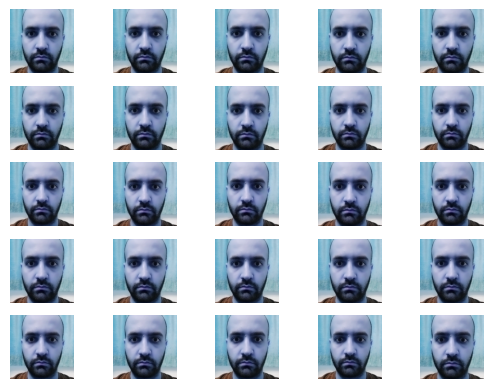

In [88]:
#Load data and plot to get a quick understanding
#CIFAR10 classes are: airplane, automobile, bird, cat, deer, dog, frog, horse,
# ship, truck

# (trainX, trainy), (testX, testy) = load_data()
with open('Sources/data.pickle', 'rb') as handle:
    (trainX,trainy) = pickle.load(handle)


# plot 25 images
for i in range(25):
	plt.subplot(5, 5, 1 + i)
	plt.axis('off')
	plt.imshow(trainX[i])
plt.show()

In [95]:
# define the standalone discriminator model
#Given an input image, the Discriminator outputs the likelihood of the image being real.
#Binary classification - true or false (1 or 0). So using sigmoid activation.

#Unlike regular GAN here we are also providing number of classes as input.
#Input to the model will be both images and labels.
def define_discriminator(in_shape=(200,200,3), n_classes=2):

    # label input
	in_label = Input(shape=(1,))  #Shape 1
	# embedding for categorical input
    #each label (total 10 classes for cifar), will be represented by a vector of size 50.
    #This vector of size 50 will be learnt by the discriminator
	li = Embedding(n_classes, 50)(in_label) #Shape 1,50
	# scale up to image dimensions with linear activation
	n_nodes = in_shape[0] * in_shape[1]  #32x32 = 1024.
	li = Dense(n_nodes)(li)  #Shape = 1, 1024
	# reshape to additional channel
	li = Reshape((in_shape[0], in_shape[1], 1))(li)  #32x32x1


	# image input
	in_image = Input(shape=in_shape) #32x32x3
	# concat label as a channel
	merge = Concatenate()([in_image, li]) #32x32x4 (4 channels, 3 for image and the other for labels)

	# downsample: This part is same as unconditional GAN upto the output layer.
    #We will combine input label with input image and supply as inputs to the model.
	fe = Conv2D(128, (3,3), strides=(2,2), padding='same')(merge) #16x16x128
	fe = LeakyReLU(alpha=0.2)(fe)
	# downsample
	fe = Conv2D(128, (3,3), strides=(2,2), padding='same')(fe) #8x8x128
	fe = LeakyReLU(alpha=0.2)(fe)
	# flatten feature maps
	fe = Flatten()(fe)  #8192  (8*8*128=8192)
	# dropout
	fe = Dropout(0.4)(fe)
	# output
	out_layer = Dense(1, activation='sigmoid')(fe)  #Shape=1

	# define model
    ##Combine input label with input image and supply as inputs to the model.
	model = Model([in_image, in_label], out_layer)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
	return model

test_discr = define_discriminator()
print(test_discr.summary())

Model: "model_13"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_27 (InputLayer)       [(None, 1)]                  0         []                            
                                                                                                  
 embedding_13 (Embedding)    (None, 1, 50)                100       ['input_27[0][0]']            
                                                                                                  
 dense_26 (Dense)            (None, 1, 40000)             2040000   ['embedding_13[0][0]']        
                                                                                                  
 input_28 (InputLayer)       [(None, 200, 200, 3)]        0         []                            
                                                                                           

In [96]:
# define the standalone generator model
#latent vector and label as inputs

def define_generator(latent_dim, n_classes=2):

	# label input
	in_label = Input(shape=(1,))  #Input of dimension 1
	# embedding for categorical input
    #each label (total 10 classes for cifar), will be represented by a vector of size 50.
	li = Embedding(n_classes, 50)(in_label) #Shape 1,50
	START = 50
	# linear multiplication
	n_nodes = START * START  # To match the dimensions for concatenation later in this step.
	li = Dense(n_nodes)(li) #1,64
	# reshape to additional channel
	li = Reshape((START, START, 1))(li)


	# image generator input
	in_lat = Input(shape=(latent_dim,))  #Input of dimension 100

	n_nodes = 128 * START * START
	gen = Dense(n_nodes)(in_lat)  #shape=8192
	gen = LeakyReLU(alpha=0.2)(gen)

	gen = Reshape((START, START, 128))(gen) #Shape=8x8x128
	# merge image gen and label input
	merge = Concatenate()([gen, li])  #Shape=8x8x129 (Extra channel corresponds to the label)
	# upsample to 16x16
	gen = Conv2DTranspose(128, (5,5), strides=(2,2), padding='same')(merge) #16x16x128
	gen = LeakyReLU(alpha=0.2)(gen)
	# upsample to 32x32
	gen = Conv2DTranspose(128, (5,5), strides=(2,2), padding='same')(gen) #32x32x128
	gen = LeakyReLU(alpha=0.2)(gen)
	# output
	out_layer = Conv2D(3, (7,7), activation='tanh', padding='same')(gen) #32x32x3
	# define model
	model = Model([in_lat, in_label], out_layer)
	return model   #Model not compiled as it is not directly trained like the discriminator.

test_gen = define_generator(100, n_classes=2)
print(test_gen.summary())

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_30 (InputLayer)       [(None, 100)]                0         []                            
                                                                                                  
 input_29 (InputLayer)       [(None, 1)]                  0         []                            
                                                                                                  
 dense_29 (Dense)            (None, 320000)               3232000   ['input_30[0][0]']            
                                                          0                                       
                                                                                                  
 embedding_14 (Embedding)    (None, 1, 50)                100       ['input_29[0][0]']     

In [97]:
 #Generator is trained via GAN combined model.
# define the combined generator and discriminator model, for updating the generator
#Discriminator is trained separately so here only generator will be trained by keeping
#the discriminator constant.
def define_gan(g_model, d_model):
	d_model.trainable = False  #Discriminator is trained separately. So set to not trainable.

    ## connect generator and discriminator...
	# first, get noise and label inputs from generator model
	gen_noise, gen_label = g_model.input  #Latent vector size and label size
	# get image output from the generator model
	gen_output = g_model.output  #32x32x3

	# generator image output and corresponding input label are inputs to discriminator
	gan_output = d_model([gen_output, gen_label])
	# define gan model as taking noise and label and outputting a classification
	model = Model([gen_noise, gen_label], gan_output)
	# compile model
	opt = Adam(lr=0.0002, beta_1=0.5)
	model.compile(loss='binary_crossentropy', optimizer=opt)
	return model

# load cifar images
def load_real_samples(trainX, trainy):
	# load dataset
	# (trainX, trainy), (_, _) = load_data()   #cifar
	# convert to floats and scale
	X = trainX.astype('float32')
	# scale from [0,255] to [-1,1]
	X = (X - 127.5) / 127.5   #Generator uses tanh activation so rescale
                            #original images to -1 to 1 to match the output of generator.
	return [X, trainy]

In [98]:
# # select real samples
# pick a batch of random real samples to train the GAN
#In fact, we will train the GAN on a half batch of real images and another
#half batch of fake images.
#For each real image we assign a label 1 and for fake we assign label 0.
def generate_real_samples(dataset, n_samples):
	# split into images and labels
	images, labels = dataset
	# choose random instances
	ix = randint(0, images.shape[0], n_samples)
	# select images and labels
	X, labels = images[ix], labels[ix]
	# generate class labels and assign to y (don't confuse this with the above labels that correspond to cifar labels)
	y = ones((n_samples, 1))  #Label=1 indicating they are real
	return [X, labels], y

# generate points in latent space as input for the generator
def generate_latent_points(latent_dim, n_samples, n_classes=2):
	# generate points in the latent space
	x_input = randn(latent_dim * n_samples)
	# reshape into a batch of inputs for the network
	z_input = x_input.reshape(n_samples, latent_dim)
	# generate labels
	labels = randint(0, n_classes, n_samples)
	return [z_input, labels]

# use the generator to generate n fake examples, with class labels
#Supply the generator, latent_dim and number of samples as input.
#Use the above latent point generator to generate latent points.
def generate_fake_samples(generator, latent_dim, n_samples):
	# generate points in latent space
	z_input, labels_input = generate_latent_points(latent_dim, n_samples)
	# predict outputs
	images = generator.predict([z_input, labels_input])
	# create class labels
	y = zeros((n_samples, 1))  #Label=0 indicating they are fake
	return [images, labels_input], y

In [99]:
# train the generator and discriminator
#We loop through a number of epochs to train our Discriminator by first selecting
#a random batch of images from our true/real dataset.
#Then, generating a set of images using the generator.
#Feed both set of images into the Discriminator.
#Finally, set the loss parameters for both the real and fake images, as well as the combined loss.
def train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=250, n_batch=5):
	bat_per_epo = int(dataset[0].shape[0] / n_batch)
	half_batch = int(n_batch / 2)  #the discriminator model is updated for a half batch of real samples
                            #and a half batch of fake samples, combined a single batch.
	# manually enumerate epochs
	for i in range(n_epochs):
		# enumerate batches over the training set
		for j in range(bat_per_epo):

             # Train the discriminator on real and fake images, separately (half batch each)
        #Research showed that separate training is more effective.
			# get randomly selected 'real' samples
            # get randomly selected 'real' samples
			[X_real, labels_real], y_real = generate_real_samples(dataset, half_batch)

            # update discriminator model weights
            ##train_on_batch allows you to update weights based on a collection
            #of samples you provide
			d_loss_real, _ = d_model.train_on_batch([X_real, labels_real], y_real)

			# generate 'fake' examples
			[X_fake, labels], y_fake = generate_fake_samples(g_model, latent_dim, half_batch)
			# update discriminator model weights
			d_loss_fake, _ = d_model.train_on_batch([X_fake, labels], y_fake)

            #d_loss = 0.5 * np.add(d_loss_real, d_loss_fake) #Average loss if you want to report single..

			# prepare points in latent space as input for the generator
			[z_input, labels_input] = generate_latent_points(latent_dim, n_batch)

            # The generator wants the discriminator to label the generated samples
        # as valid (ones)
        #This is where the generator is trying to trick discriminator into believing
        #the generated image is true (hence value of 1 for y)
			# create inverted labels for the fake samples
			y_gan = ones((n_batch, 1))
             # Generator is part of combined model where it got directly linked with the discriminator
        # Train the generator with latent_dim as x and 1 as y.
        # Again, 1 as the output as it is adversarial and if generator did a great
        #job of folling the discriminator then the output would be 1 (true)
			# update the generator via the discriminator's error
			g_loss = gan_model.train_on_batch([z_input, labels_input], y_gan)
			# Print losses on this batch
			print('Epoch>%d, Batch%d/%d, d1=%.3f, d2=%.3f g=%.3f' %
				(i+1, j+1, bat_per_epo, d_loss_real, d_loss_fake, g_loss))
	# save the generator model
	g_model.save('cifar_conditional_generator_25epochs.h5')

In [100]:
#Train the GAN

# size of the latent space
latent_dim = 100
# create the discriminator
d_model = define_discriminator()
# create the generator
g_model = define_generator(latent_dim)
# create the gan
gan_model = define_gan(g_model, d_model)
# load image data
dataset = load_real_samples(trainX,trainy)
# train model
train(g_model, d_model, gan_model, dataset, latent_dim, n_epochs=10)

1/1 [==============================] - 1s 649ms/step
Epoch>1, Batch1/31, d1=0.748, d2=0.713 g=0.815
1/1 [==============================] - 1s 506ms/step
Epoch>1, Batch2/31, d1=0.000, d2=0.795 g=1.182
1/1 [==============================] - 1s 512ms/step
Epoch>1, Batch3/31, d1=0.001, d2=0.340 g=2.165
1/1 [==============================] - 1s 503ms/step
Epoch>1, Batch4/31, d1=1.591, d2=0.282 g=1.647
1/1 [==============================] - 1s 511ms/step
Epoch>1, Batch5/31, d1=0.000, d2=0.245 g=2.282
1/1 [==============================] - 1s 722ms/step
Epoch>1, Batch6/31, d1=0.000, d2=0.859 g=3.933
1/1 [==============================] - 1s 504ms/step
Epoch>1, Batch7/31, d1=0.000, d2=0.497 g=4.750
1/1 [==============================] - 0s 492ms/step
Epoch>1, Batch8/31, d1=0.000, d2=0.302 g=10.802
1/1 [==============================] - 1s 500ms/step
Epoch>1, Batch9/31, d1=0.000, d2=0.608 g=12.005
1/1 [==============================] - 0s 491ms/step
Epoch>1, Batch10/31, d1=0.000, d2=0.347 g=18.

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch>10, Batch31/31, d1=0.176, d2=0.230 g=4.935


In [101]:
# Now, let us load the generator model and generate images
# Lod the trained model and generate a few images
from numpy import asarray
from numpy.random import randn
from numpy.random import randint
from keras.models import load_model
import numpy as np

In [102]:
model = load_model('cifar_conditional_generator_25epochs.h5')

In [103]:
latent_points, labels = generate_latent_points(100, 20)

In [104]:
X  = model.predict([latent_points, labels])
X = (X + 1) / 2.0
X = (X*255).astype(np.uint8)

1/1 [==============================] - 5s 5s/step


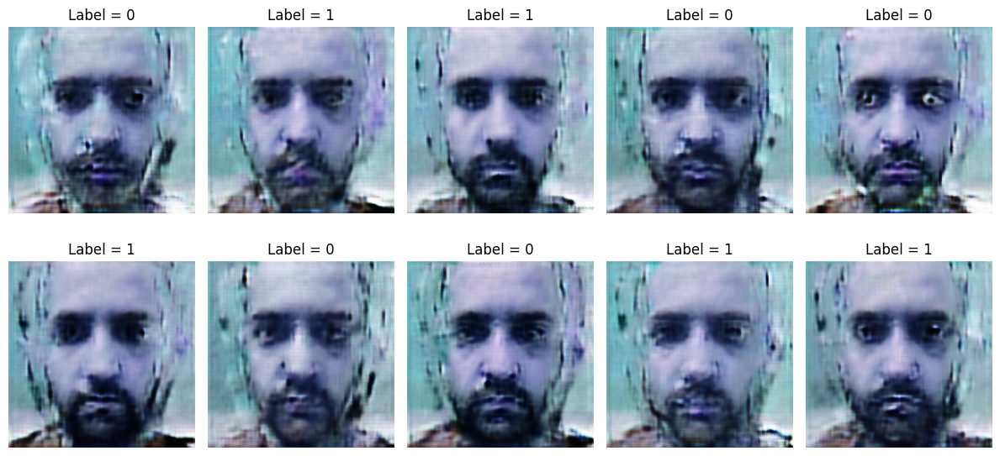

In [115]:
fig, axs = plt.subplots(2, 5, figsize=(12, 6))
axs = axs.flatten()
for i in range(10):
    ax = axs[i]  # Select the current subplot
    ax.imshow(X[i,:,:,:])  # Display the image
    ax.set_title(f"Label = {labels[i]}")  # Set the subplot title
    ax.axis('off')  # Turn off axis labels

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

# Now we need to create the video to bypass the security webcam.
## we need to generate 150 frames (5 sec video) in a way that for each 25 fram we should have a heartbeat

In [141]:
model = load_model('cifar_conditional_generator_25epochs.h5')

latent_points, labels = generate_latent_points(100, 150)
labels1 = [1 if i%25==0 else 0 for i in range(150)]
labels1 = np.array(labels1)

X  = model.predict([latent_points, labels1])
X = (X + 1) / 2.0
X = (X*255).astype(np.uint8)

5/5 [==============================] - 35s 7s/step


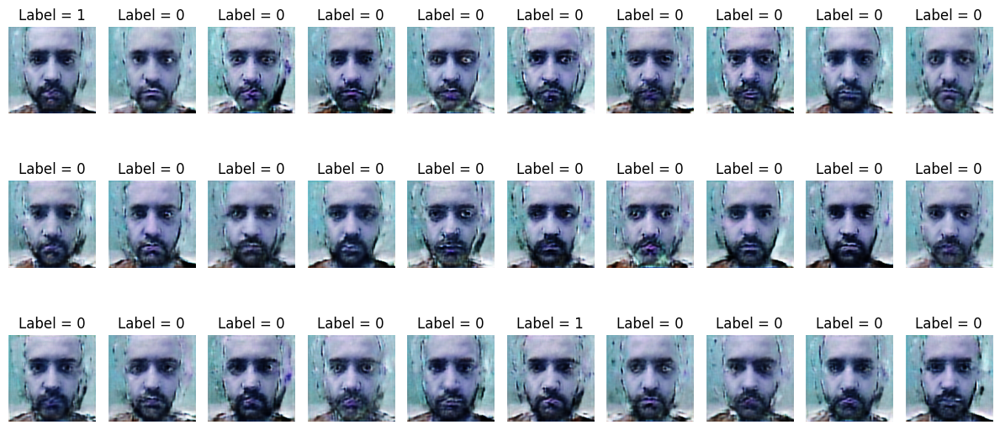

In [146]:
fig, axs = plt.subplots(3, 10, figsize=(12, 6))
axs = axs.flatten()
for i in range(30):
    ax = axs[i]  # Select the current subplot
    ax.imshow(X[i,:,:,:])  # Display the image
    ax.set_title(f"Label = {labels1[i]}")  # Set the subplot title
    ax.axis('off')  # Turn off axis labels

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [155]:
# Define video properties
height, width, channels = X[0].shape
fps = 30.0  # Frames per second
duration = 5  # Duration in seconds

# Define the output video file name and codec
output_video = 'output_video.mp4'
fourcc = cv2.VideoWriter_fourcc(*'mp4v')  # You can also use other codecs like 'XVID', 'MJPG', etc.

# Create a VideoWriter object
out = cv2.VideoWriter(output_video, fourcc, fps, (width, height))

# Calculate number of frames needed for the 5-second video
num_frames_needed = int(fps * duration)

# Iterate through frames and write to video
for i in range(num_frames_needed):
    # Assuming the frames_array contains 150 frames, you may need to handle the end case
    frame = X[i % len(X)]  # Loop through frames if needed
    out.write(frame)

# Release the VideoWriter and destroy any OpenCV windows
out.release()
cv2.destroyAllWindows()

print("Video created successfully!")

Video created successfully!


# Detect heartbeat :

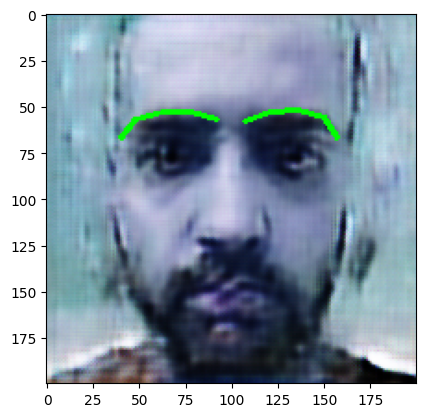

In [156]:
# Load the face detector and facial landmark predictor from Dlib
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor('Sources/shape_predictor_68_face_landmarks.dat')
# Replace 'path_to_shape_predictor_68_face_landmarks.dat' with the actual path to the model file

# Load the image of the face
face_image = X[0].copy()
gray = cv2.cvtColor(face_image, cv2.COLOR_BGR2GRAY)

# Detect faces in the image
faces = detector(gray)

for face in faces:
    # Predict facial landmarks for each detected face
    landmarks = predictor(gray, face)

    # Extract eyebrow points (example: points 17-21 for the left eyebrow and 22-26 for the right eyebrow)
    left_eyebrow_pts = [17, 18, 19, 20, 21]  # Example landmark points for the left eyebrow
    right_eyebrow_pts = [22, 23, 24, 25, 26]  # Example landmark points for the right eyebrow

    # Get coordinates of the eyebrow points
    left_eyebrow = [landmarks.part(pt) for pt in left_eyebrow_pts]
    right_eyebrow = [landmarks.part(pt) for pt in right_eyebrow_pts]

    # Draw lines to visualize the eyebrows on the face image
    for i in range(len(left_eyebrow) - 1):
        cv2.line(face_image, (left_eyebrow[i].x, left_eyebrow[i].y), (left_eyebrow[i + 1].x, left_eyebrow[i + 1].y), (0, 255, 0), 2)
    for i in range(len(right_eyebrow) - 1):
        cv2.line(face_image, (right_eyebrow[i].x, right_eyebrow[i].y), (right_eyebrow[i + 1].x, right_eyebrow[i + 1].y), (0, 255, 0), 2)

# Display the face image with detected eyebrows
plt.imshow(face_image)

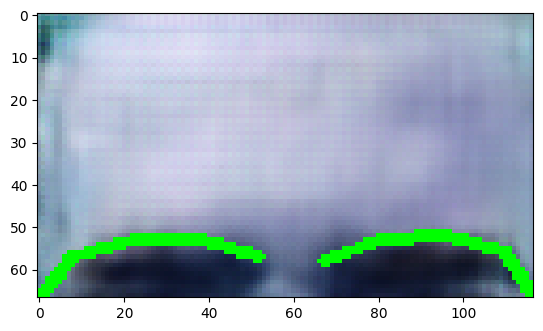

In [157]:
# Now that we have the eyebrows' location, getting the forehead is a piece of cake
plt.imshow(face_image[:left_eyebrow[0].y,left_eyebrow[0].x:right_eyebrow[-1].x,:])

In [160]:
# apply the same thing on all the 50 images
foreheads = []
for face_image in X:
    gray = cv2.cvtColor(face_image, cv2.COLOR_BGR2GRAY)

    # Detect faces in the image
    faces = detector(gray)

    for face in faces:
        # Predict facial landmarks for each detected face
        landmarks = predictor(gray, face)

        # Extract eyebrow points (example: points 17-21 for the left eyebrow and 22-26 for the right eyebrow)
        left_eyebrow_pts = [17, 18, 19, 20, 21]  # Example landmark points for the left eyebrow
        right_eyebrow_pts = [22, 23, 24, 25, 26]  # Example landmark points for the right eyebrow

        # Get coordinates of the eyebrow points
        left_eyebrow = [landmarks.part(pt) for pt in left_eyebrow_pts]
        right_eyebrow = [landmarks.part(pt) for pt in right_eyebrow_pts]
        foreheads.append((left_eyebrow[0].y,left_eyebrow[0].x,right_eyebrow[-1].x))
    # foreheads.append(face_image[:left_eyebrow[0].y,left_eyebrow[0].x:right_eyebrow[-1].x,:])

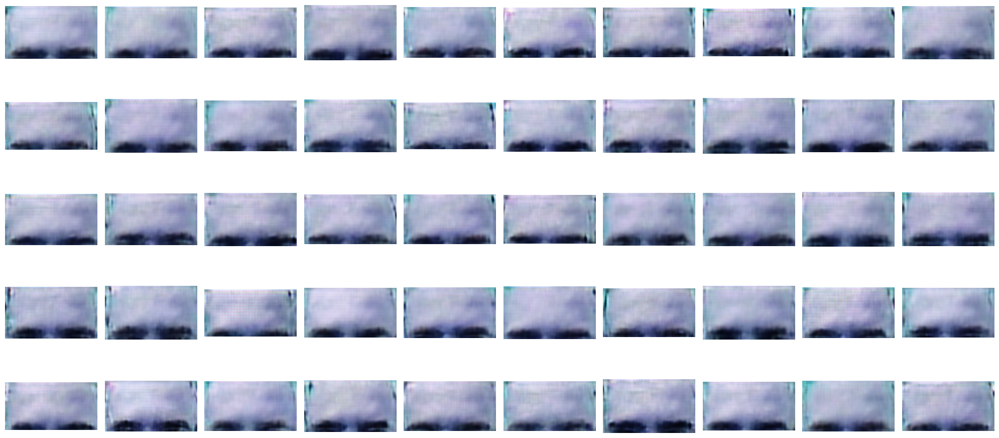

In [161]:
#Let's take a look at all 50 recognizied faces
fig, axs = plt.subplots(5, 10, figsize=(20, 10))  # 5 rows, 10 columns

# Flattening the axes to easily iterate through subplots
axs = axs.flatten()

for i, ax in enumerate(axs):
    ax.imshow(X[i][:foreheads[i][0],foreheads[i][1]:foreheads[i][2],:], cmap='gray')  # Displaying each image
    ax.axis('off')  # Turn off axis labels

plt.tight_layout()  # Adjust layout for better presentation
plt.show()

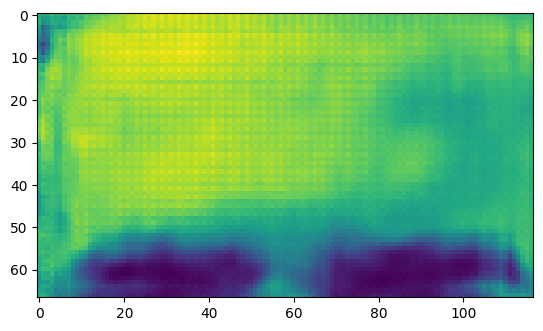

In [162]:
# We need the green channel:
plt.imshow(X[0][:foreheads[0][0],foreheads[0][1]:foreheads[0][2],:][:,:,1])

In [163]:
new_pixels = []
for i in range(len(foreheads)):
    pca = PCA(n_components=5)
    pca.fit(X[i][:foreheads[i][0],foreheads[i][1]:foreheads[i][2],:][:,:,1])
    new_pixels.append(pca.transform(All_faces[i][:foreheads[i][0],foreheads[i][1]:foreheads[i][2],:][:,:,1]))

In [173]:
pixel_counter = []
for forehead in new_pixels:
    pixel_counter.append(np.sum(forehead[:,4]))

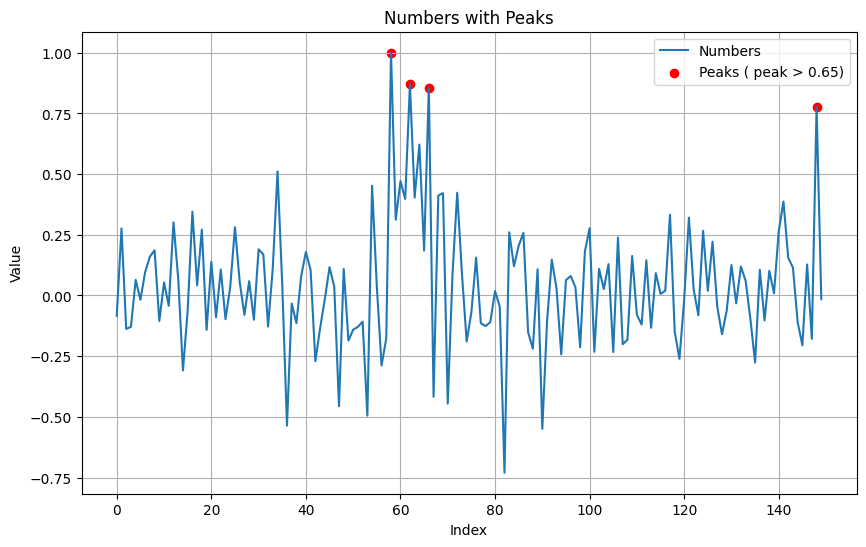

In [174]:
numbers  = pixel_counter/max(pixel_counter)
# Create a list to store peak values and their indices
peaks = [(index, value) for index, value in enumerate(numbers) if value > 0.65]

# Separate indices and values of peaks for plotting
peak_indices, peak_values = zip(*peaks)

# Plotting the list of numbers
plt.figure(figsize=(10, 6))
plt.plot(numbers, label='Numbers')
plt.scatter(peak_indices, peak_values, color='red', marker='o', label='Peaks ( peak > 0.65)')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Numbers with Peaks')
plt.legend()
plt.grid(True)
plt.show()

In [175]:
Heart_Rate = len(peaks) * (60/(peaks[-1][0]/30)-(peaks[0][0]/30)) #My camera is 30fps
Heart_Rate

40.91531531531531

In [176]:
# This is a problem!